# Convolutional Neural Networks

## Computer Vision

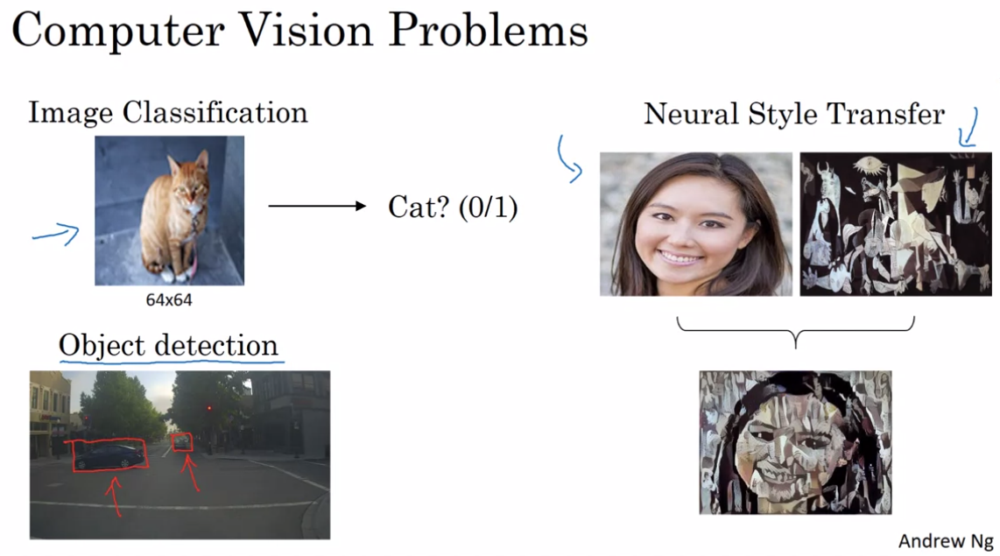

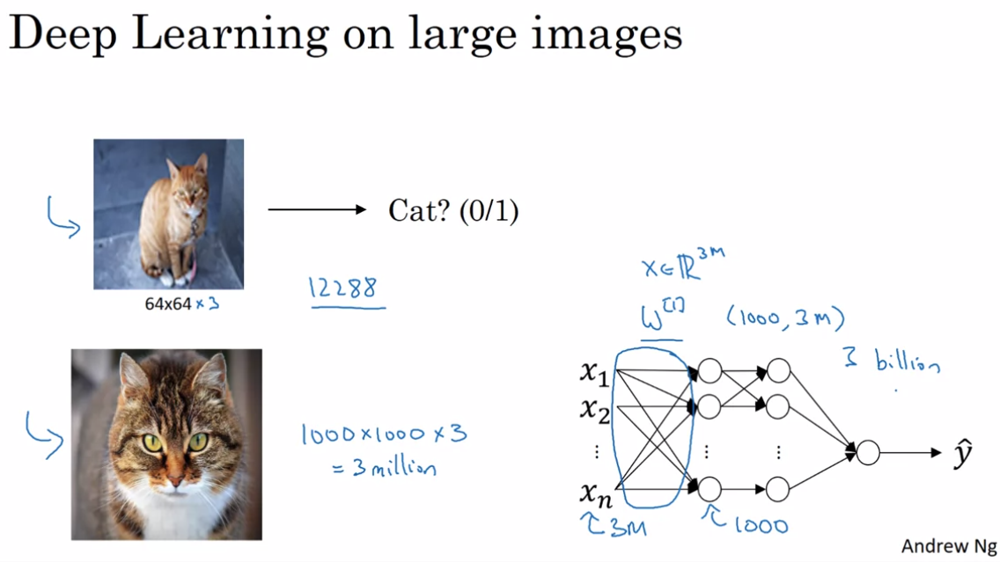

- With a huge number of parameters as shown above, it is hard to avoid overfitting and slow to train effective models.
- That's why we need the **convolution** technique.

## Edge Detection Example
- The following example shows the **convolution** calculation.
    - We first define a **filter**.
    - Then find the corresponding "sub-matrix" in the image, and compute the sum of element-wise product.
    - The resulting matrix is a "new image" after convolution.
- Different programming languages / deep learning frameworks have different functions for convolution.
    - Python: `conv-forward`
    - tensorflow: `tf.nn.conv2d`
    - keras: `Cov2D`
    
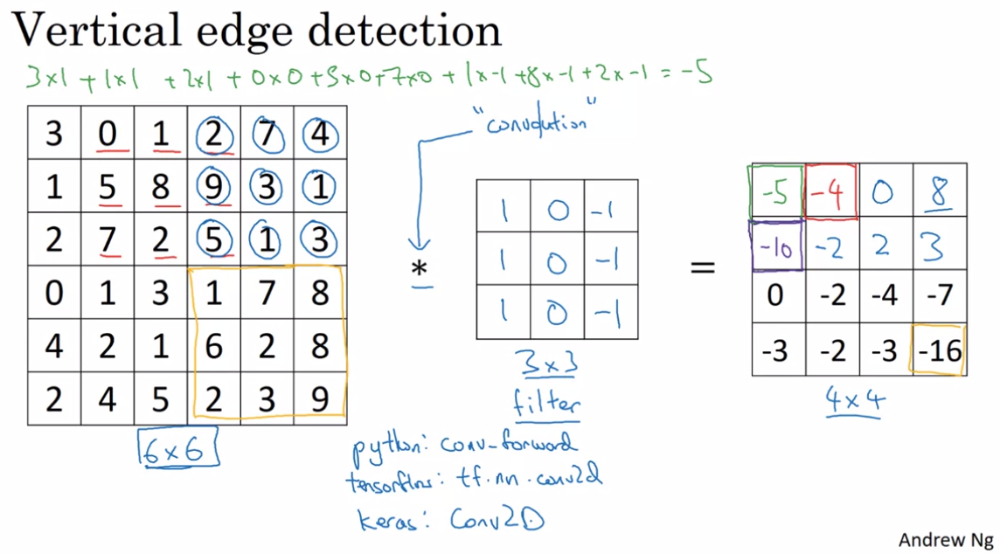

- How does the vertical edge detecter work?

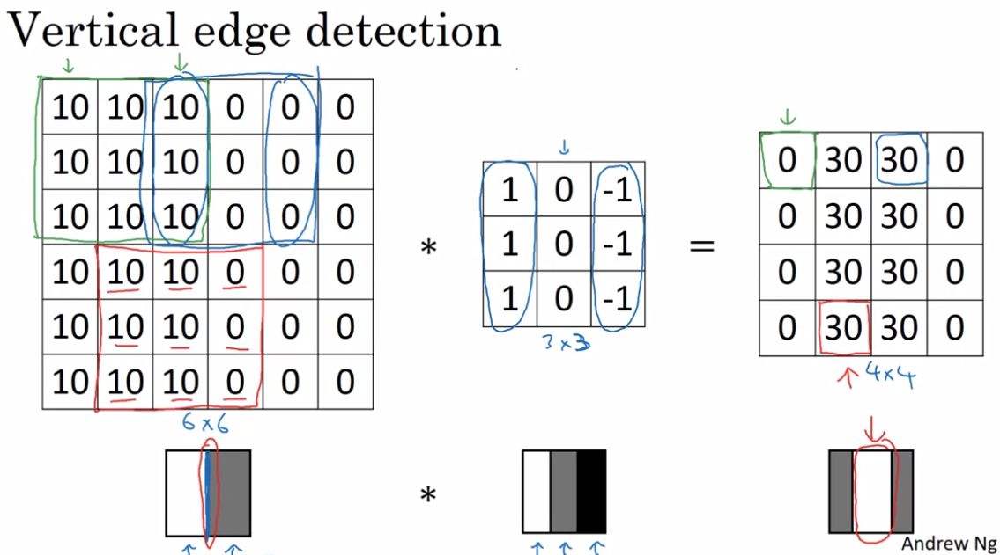

## More Edge Detection
- Light to Dark vs. Dark to Light Edges

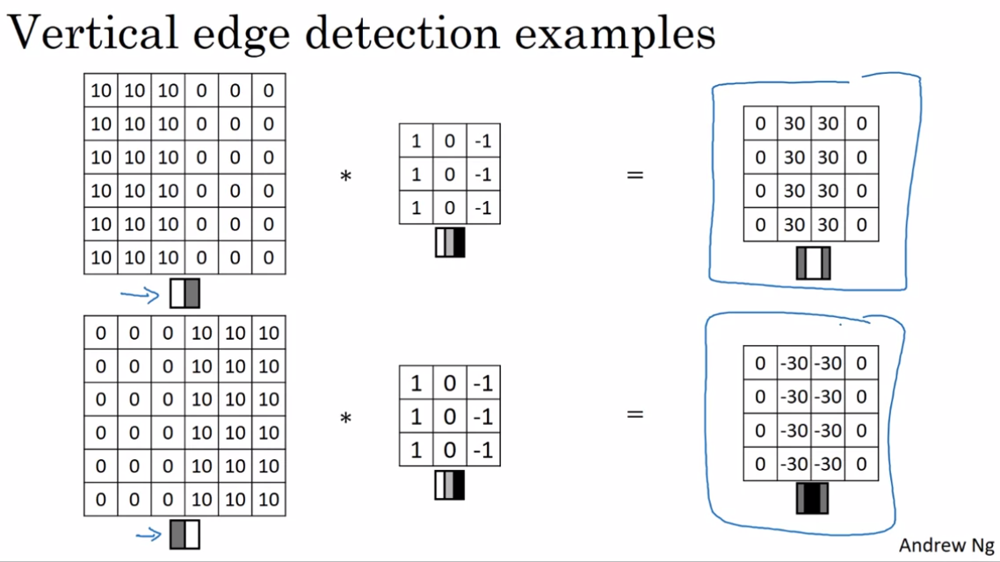

- Different filters allow you to detect different edges, vertical or horizontal.

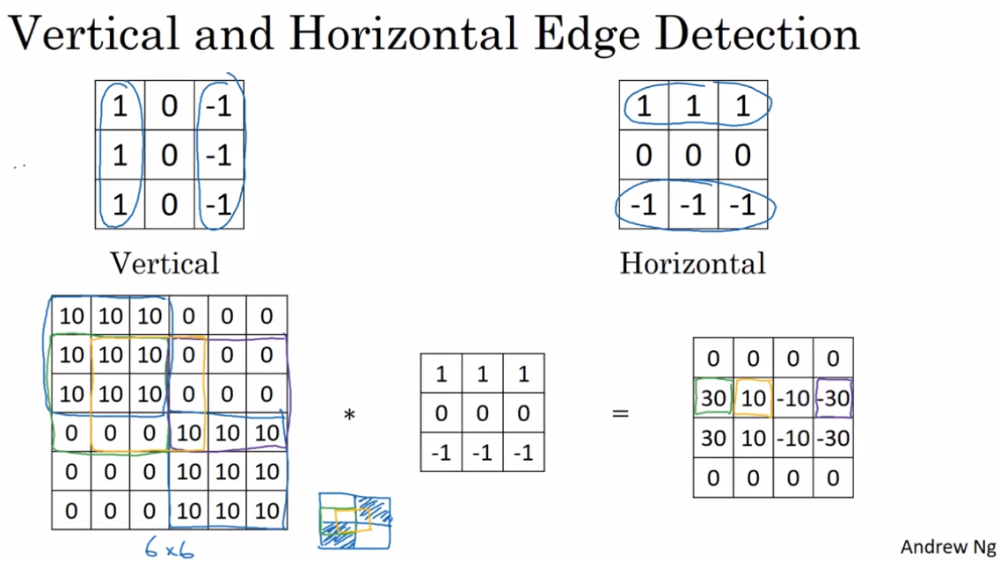

- Learning to Detect Edges
    - We treat numbers (i.e. weights) in filters as parameters and train them to detect edges that might be more complicated than vertical and horizontal straight line edges.
    - The **convolution** operation allows **backpropagation** for training all the weights $W_{i}$ in the filter.
    
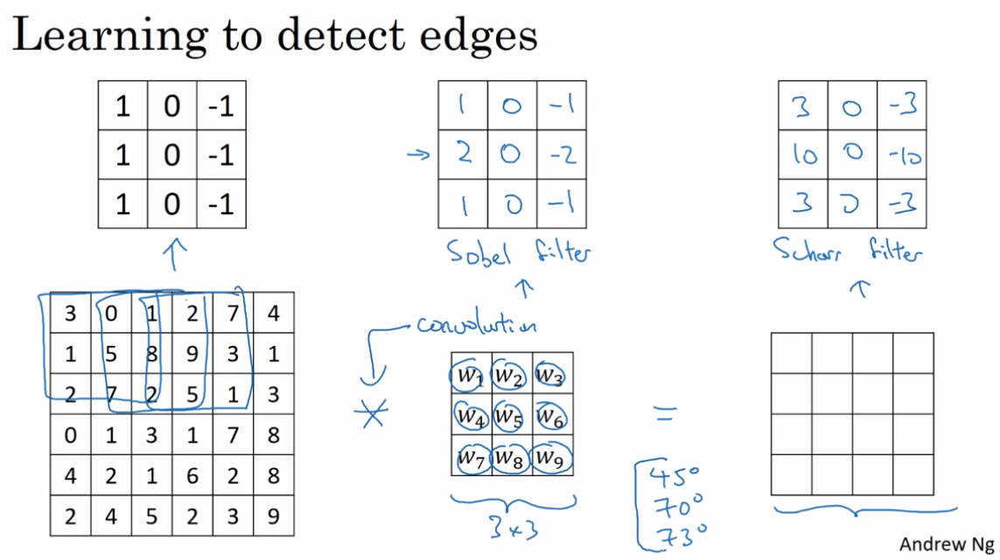

## Padding
- Two Problems with Convolution
    1. Shrinking Output
        - Given a $n \times n$ image and a $f \times f$ filter, the convolution output will be $(n-f+1) \times (n-f+1)$, which is smaller than the original image.
    2. Because pixels on the edge or corner of the original image are used much less than those in the middle during convolution, we are thowing away information from edges and corners in the process.
- To solve these problems, we use the technique called **padding** and conduct **padded convolution**.
    - We add $p$ pixels of $0$ around the boarder of the previous image and then run convolution.
    - **Same Convolutions**
        - Pad $p = \frac{f - 1}{2}$ so that the output size is $(n + 2p - f + 1) \times (n + 2p - f + 1) = n \times n$
- With no padding, it's called **valid convolution**.

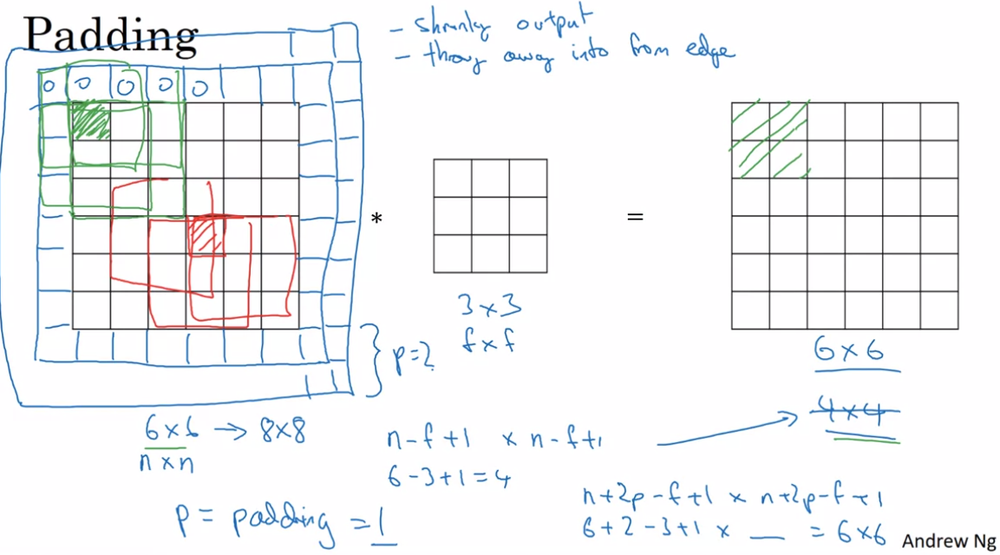

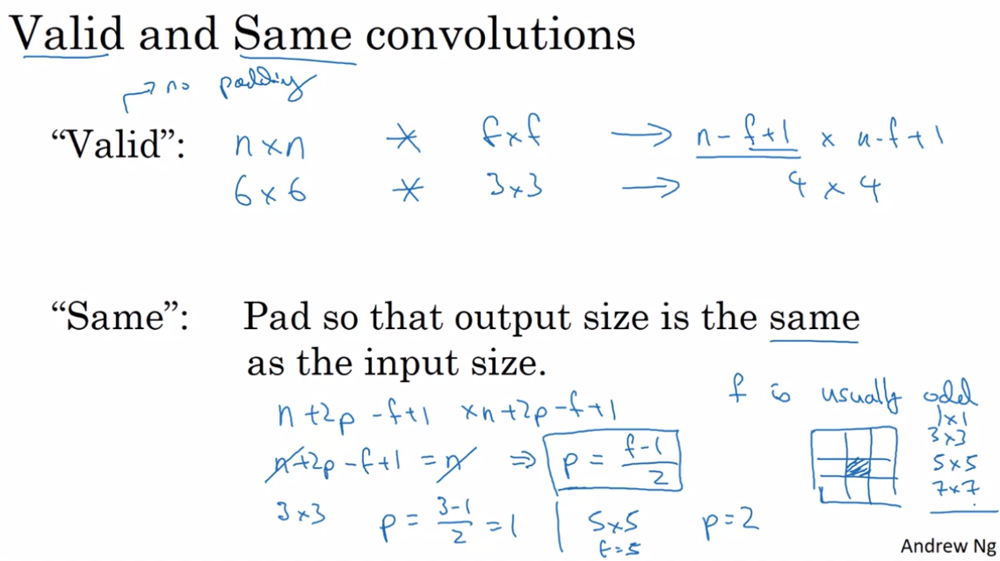

## Strided Convolutions
- When applying **strided convolution** with $stride = s$, we take step of $s$ when selecting sub-matrices to apply filters to.
- Summary
    - Image size $n \times n$
    - Filter size $f \times f$
    - If applying convolution with $padding = p$ and $stride = s$, we get an output of shape $ \lfloor \frac{n + 2p - f}{s} + 1 \rfloor \times \lfloor \frac{n + 2p - f}{s} + 1 \rfloor$.
        - When the formula does not deliver an integer, we round down the output shape ($\lfloor x \rfloor$ means flooring).
        - This corresponds to the case when stride $s$ cause the filter to be applied partially outside the original image, we'll then not conduct element-wise multiplication.
        
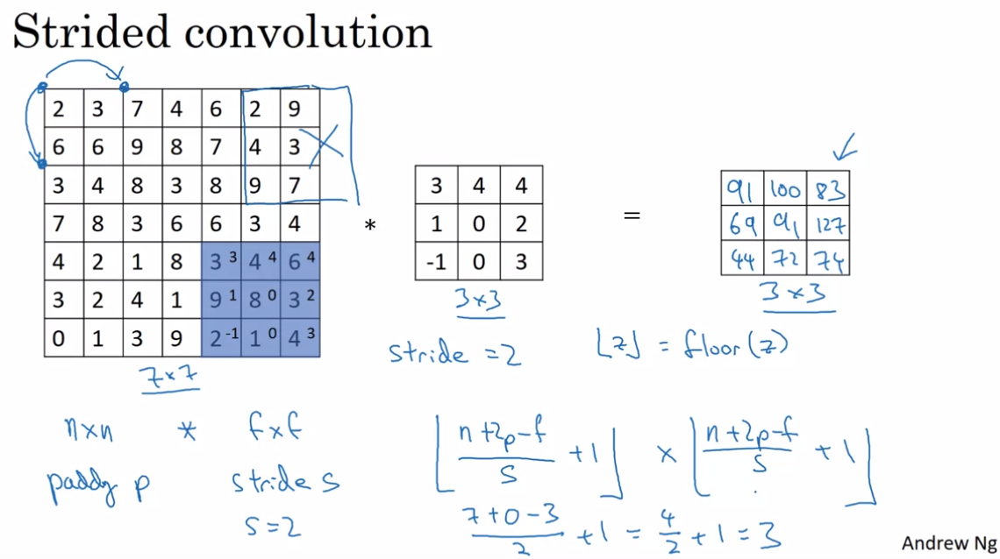

- Side Note
    - In many text books, convolution operation takes an additonal step of flipping the filter matrix before element-wise multiplications.
        - The flipped result in the screenshot below is actually wrong.
        - The matrix should be flipped vertically and then horizontally, not flipped over diagonal.
    - What we conducted (without the flipping step) is instead called the **cross-correlation** operation.
    - But by deep learning convenions, we will just use **cross_correlation** and keep calling it **convolution**.
    
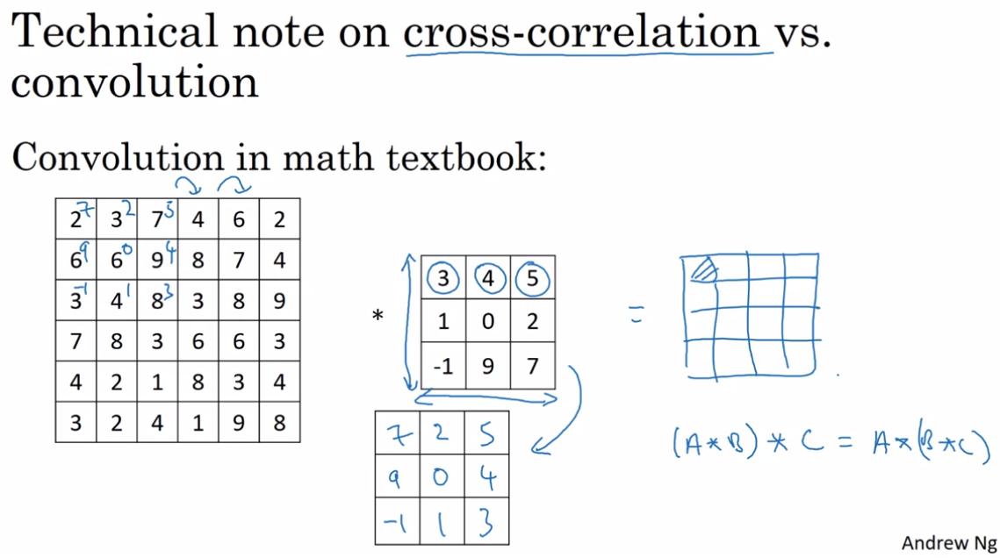

## Convolutions Over Volume

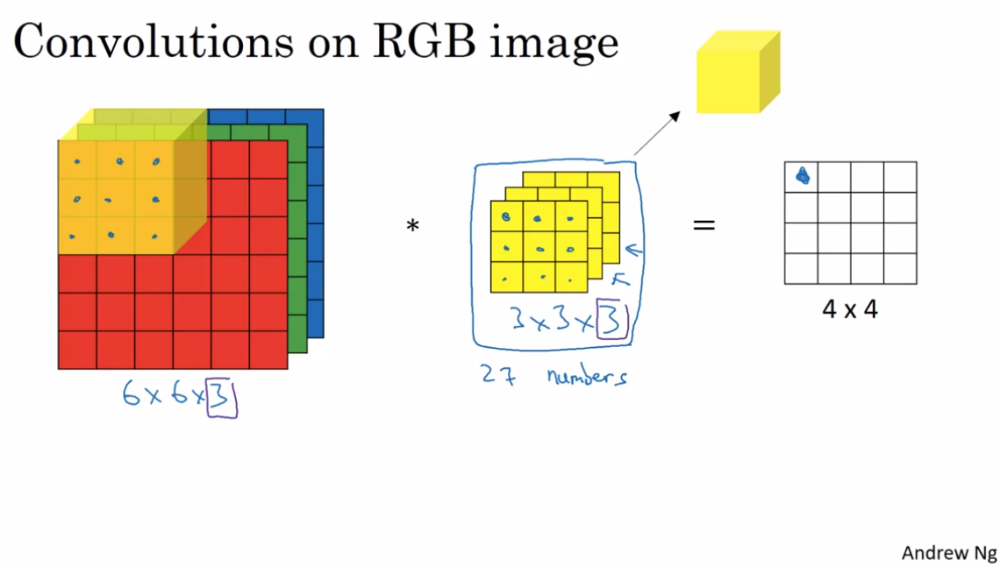

- Each chanel in the filter corresponds to a channel in the RGB image.
    - If we only want to build vertical edge detector only in the red channel, we canse the filter as:
        - Red: $\begin{bmatrix} 1 & 0 & -1 \\ 1 & 0 & -1 \\ 1 & 0 & -1 \end{bmatrix}$ Green: $\begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & 0 \\ 0 & 0 & 0 \end{bmatrix}$ Blue: $\begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & 0 \\ 0 & 0 & 0 \end{bmatrix}$
    - To build vertical edge detector in any color, we canse the filter as:
        - Red: $\begin{bmatrix} 1 & 0 & -1 \\ 1 & 0 & -1 \\ 1 & 0 & -1 \end{bmatrix}$ Green: $\begin{bmatrix} 1 & 0 & -1 \\ 1 & 0 & -1 \\ 1 & 0 & -1 \end{bmatrix}$ Blue: $\begin{bmatrix} 1 & 0 & -1 \\ 1 & 0 & -1 \\ 1 & 0 & -1 \end{bmatrix}$

- What if we want to detect multiple edges (i.e. apply multiple filters) at the same time?

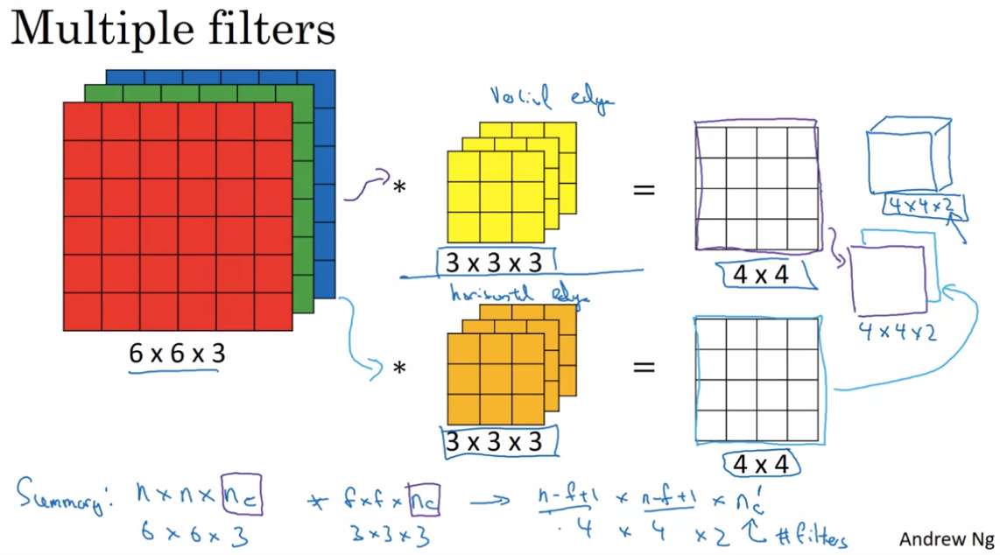

## One Layer of Convolutional Neural Network
- The First Layer of a Standard Neural Network:
    - $z^{[1]} = W^{[1]} x + b^{[1]}$
    - $a^{[1]} = g(z^{[1]})$
- For CNN:
    - Consider the original image as the input $x$
    - Consider the filter as $W^{[1]}$.
    - Consider the output of convolution as $W^{[1]} x$
    
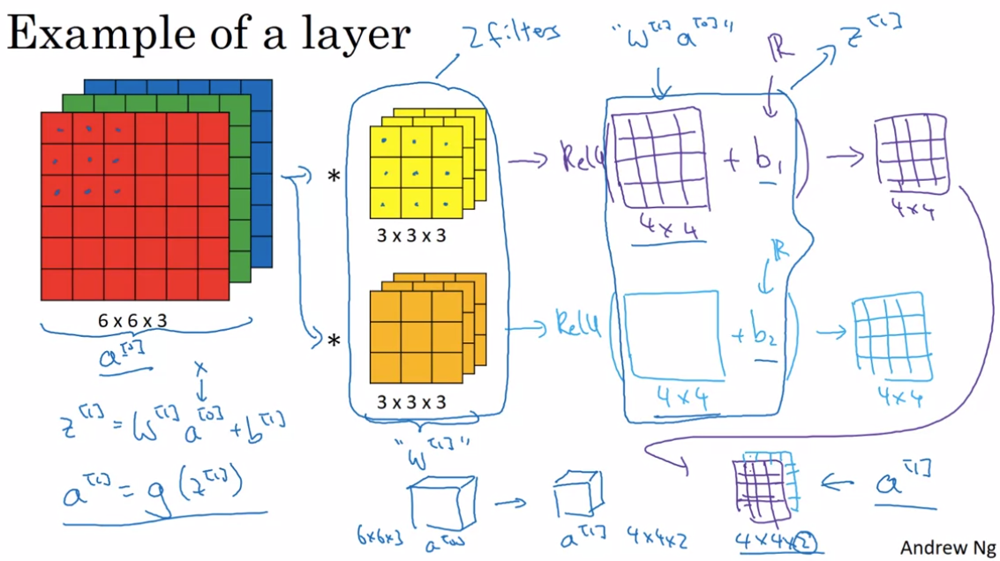

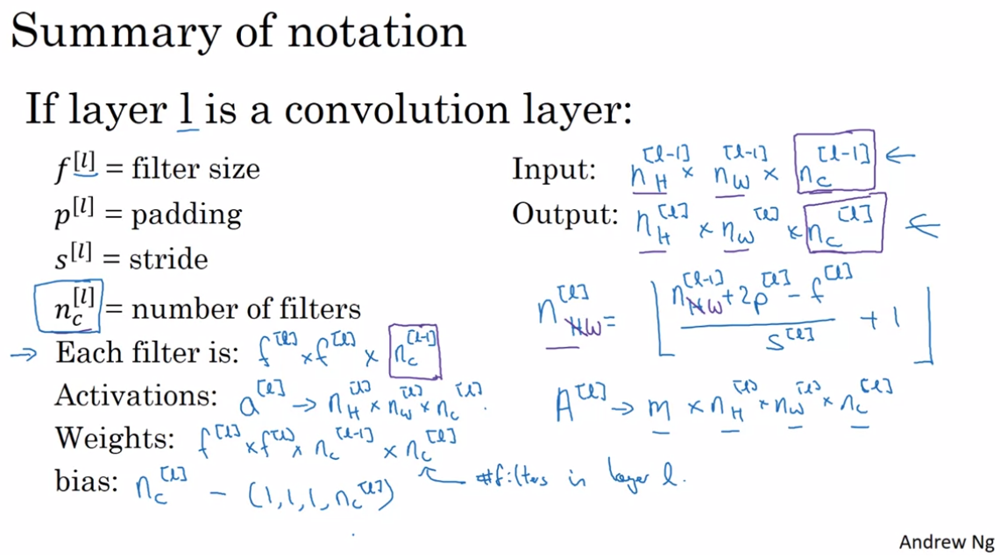

## Simple Convolutional Network Example

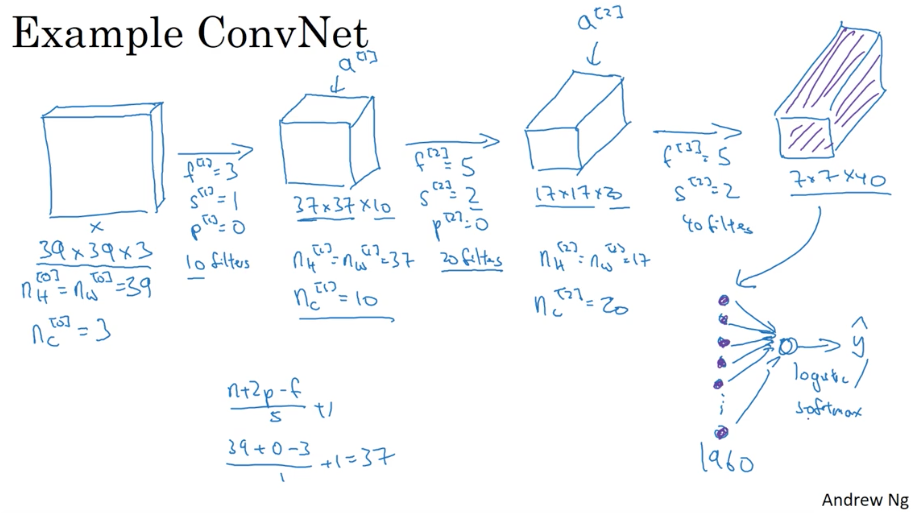

- A general trend is that as it goes deeper in the ConvNet,
    - Filter output image size $n_{H}^{[l]}$ and $n_{W}^{[l]}$ gets smaller.
    - Number of output channels $n_{c}^{[l]}$ could stay stable or increase.
- Types of layers in a ConvNet
    - **Convolution** (CONV)
    - **Pooling** (POOL)
    - **Fully** Connected (FC)

## Pooling Layers
- Pooling Layer: **Max Pooling**
    - Instead of element-wise multiplications in convolution, max pooling takes the **maximum** of each region that the filter is applied to.
    - Note that max pooling layers only takes two hyperparameters $f$ and $s$. Once they are fixed, there is no parameters to be learned during backpropagation.
    
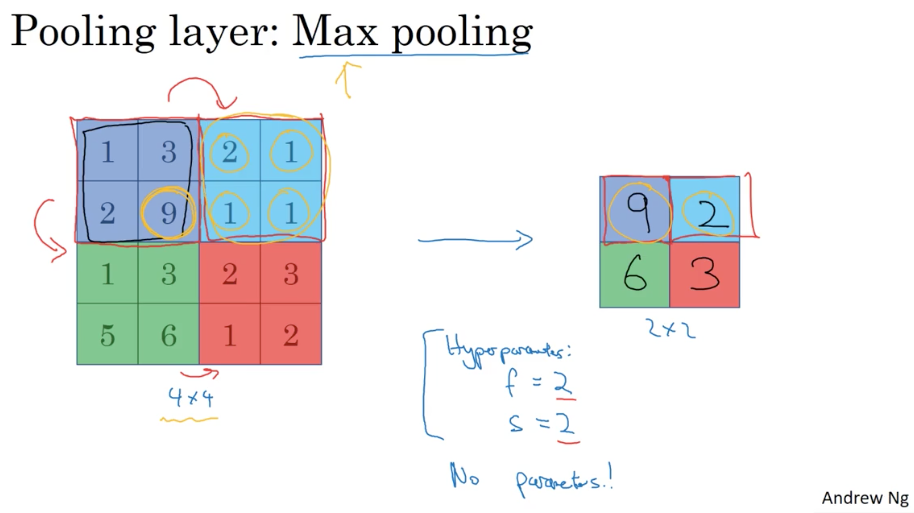

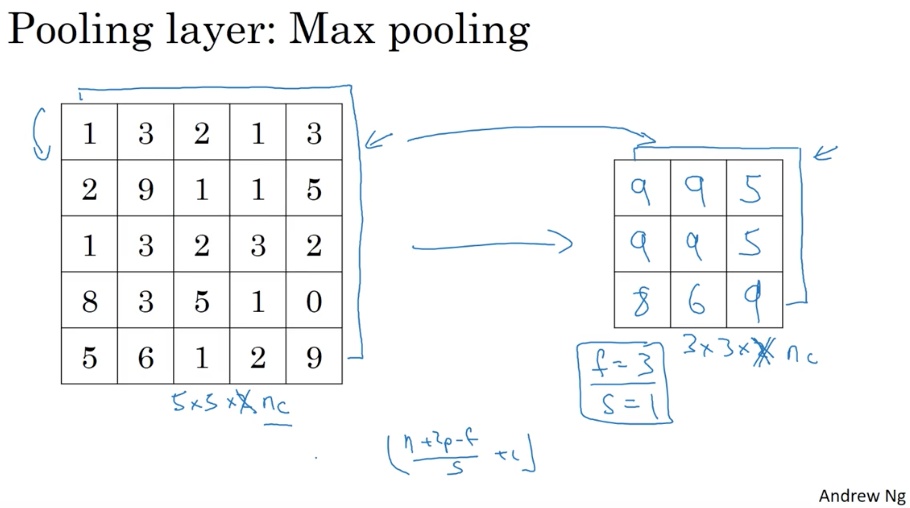

- Pooling Layer: **Average Pooling**
    - Average pooling takes the **average** of each region that the filter is applied to.
    
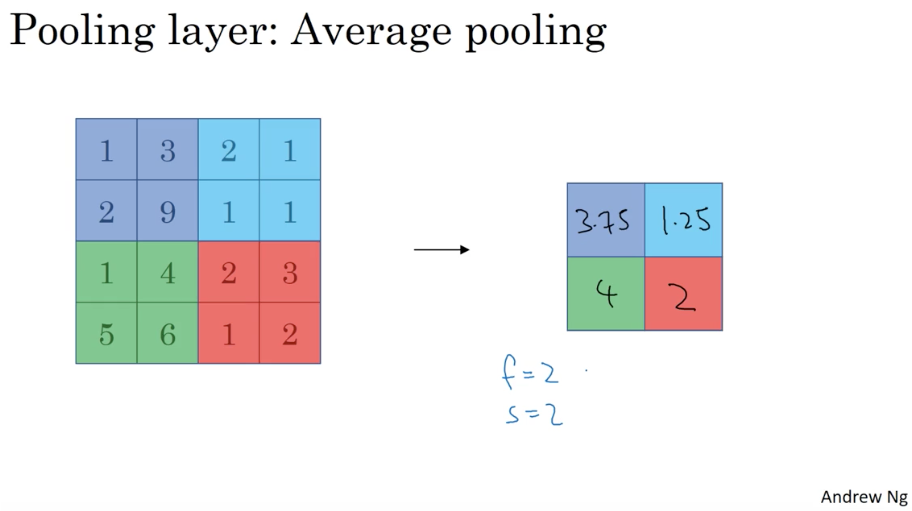

- Summary of Pooling
    - Hyperparameters
        - $f$: filter size
        - $s$: stride
        - $p$: usually set 0
        - Max or Average Pooling
    - Input Size: $n_{H} \times n_{W} \times n_{C}$
    - Output Size: $\lfloor \frac{n_{H} + 2p - f}{s} + 1 \rfloor \times \lfloor \frac{n_{H} + 2p - f}{s} + 1 \rfloor \times n_{C}$

## Convolutional Neural Network Example
- The example below is a CNN developed by Yann LeCun.
    - Note: Because pooling layers don't contain weights $W_{j}^{[l]}$ to be trained, we usually treat a convolution layer and a pooling layer together as one layer.
    
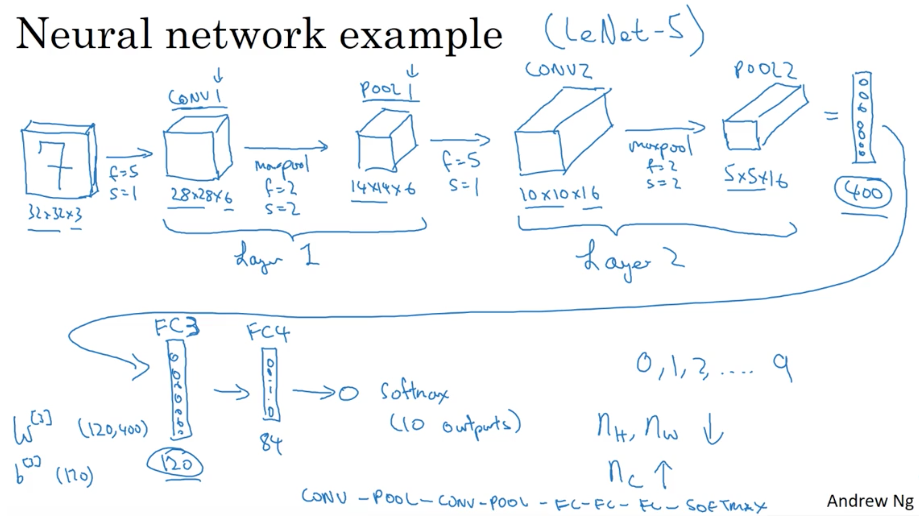

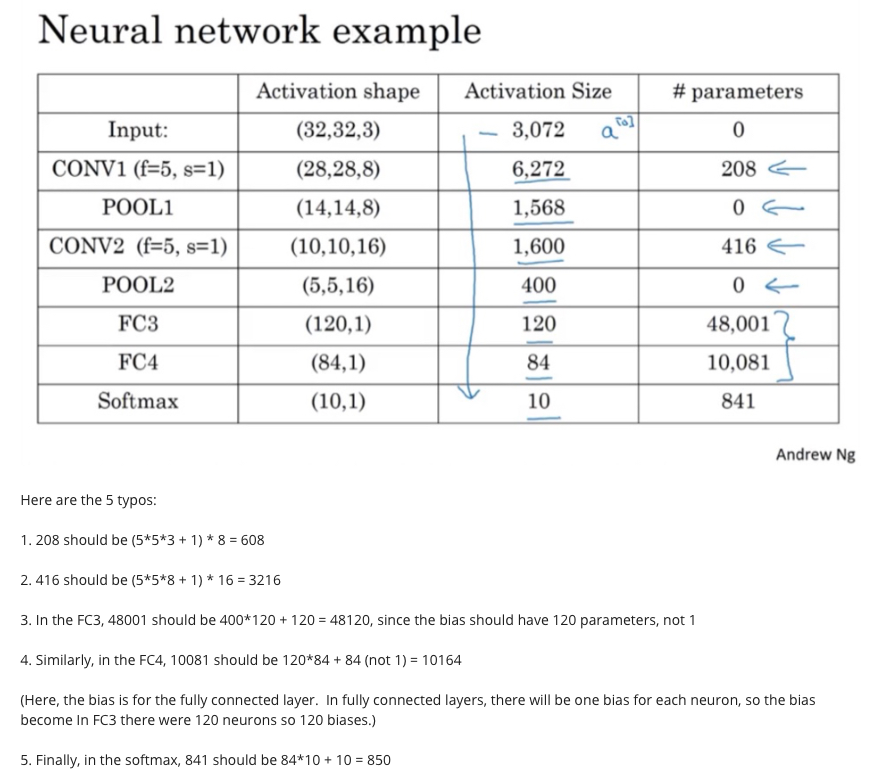

## Why Convolutions?

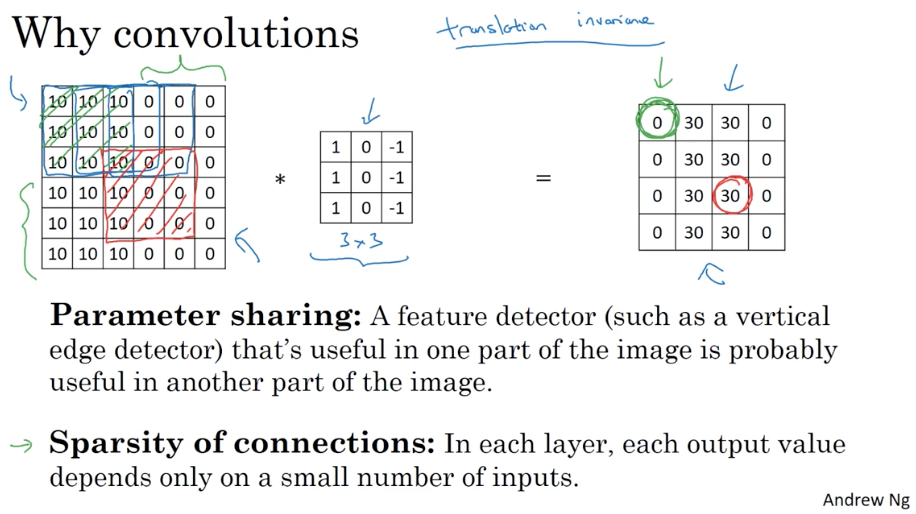

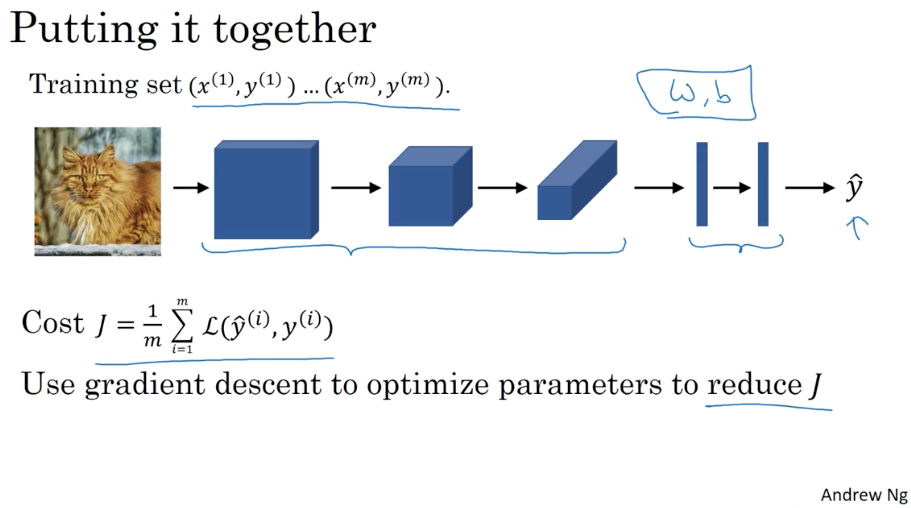

- For any convolution layer $l$, we have number of parameters as:

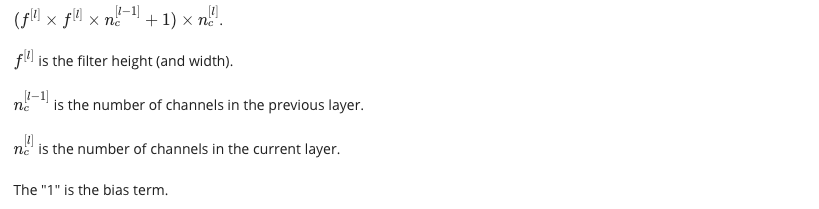